In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
from yellowbrick.classifier import ClassificationReport

In [2]:
avaliacao_terrorismo = pd.read_csv("C:/Users/Spaox/Documents/Projeto/Arquivos/Tabelas/Exportadas/analise_terrorismo.csv", sep=';', encoding='latin-1')

In [3]:
avaliacao_terrorismo

,id,id_evento,ano,mes,dia,nome_continente,codigo_pais,nome_pais,iso,codigo_regiao,...,grupo_terrorista,identificacao_grupo,reivindicacao_ataque,codigo_tipo_arma,tipo_arma,numero_obitos,houve_obitos,numero_feridos,houve_feridos,danos_propriedades
0,1,201001010002,2010,1,1,Asia,4,Afghanistan,AF,6,...,Taliban,1,1,6,Explosives,4,1,0,0,1
1,2,201001010003,2010,1,1,Asia,153,Pakistan,PK,6,...,Tehrik-i-Taliban Pakistan (TTP),1,0,6,Explosives,0,0,0,0,1
2,3,201001010004,2010,1,1,Asia,153,Pakistan,PK,6,...,Unknown,0,0,6,Explosives,0,0,0,0,0
3,4,201001010005,2010,1,1,Asia,153,Pakistan,PK,6,...,Unknown,0,0,6,Explosives,0,0,0,0,1
4,5,201001010006,2010,1,1,Asia,153,Pakistan,PK,6,...,Unknown,0,0,6,Explosives,0,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
90750,90751,201812310029,2018,12,31,Asia,4,Afghanistan,AF,6,...,Unknown,0,0,5,Firearms,1,1,0,0,0
90751,90752,201812310030,2018,12,31,Asia,4,Afghanistan,AF,6,...,Taliban,1,0,8,Incendiary,8,1,0,0,1
90752,90753,201812310031,2018,12,31,Asia,4,Afghanistan,AF,6,...,Taliban,1,0,13,Unknown,0,0,0,0,1
90753,90754,201812310032,2018,12,31,Asia,4,Afghanistan,AF,6,...,Taliban,1,0,13,Unknown,1,1,0,0,0


In [4]:
dataset_avaliacao_terrorismo = avaliacao_terrorismo[['nome_regiao', 'ano', 'mes', 'dia', 'criterio1','criterio2','criterio3', 'ataques_conectados', 'sucesso_ataque','metodo_ataque', 'tipo_vitima', 'nac_alvo', 'identificacao_grupo', 'reivindicacao_ataque', 'tipo_arma', 'numero_obitos', 'numero_feridos', 'danos_propriedades', 'duvida_terrorismo']].copy()

In [5]:
dataset_avaliacao_terrorismo

,nome_regiao,ano,mes,dia,criterio1,criterio2,criterio3,ataques_conectados,sucesso_ataque,metodo_ataque,tipo_vitima,nac_alvo,identificacao_grupo,reivindicacao_ataque,tipo_arma,numero_obitos,numero_feridos,danos_propriedades,duvida_terrorismo
0,South Asia,2010,1,1,1,1,1,0,1,Bombing/Explosion,Private Citizens & Property,Afghanistan,1,1,Explosives,4,0,1,0
1,South Asia,2010,1,1,1,1,1,0,1,Bombing/Explosion,Private Citizens & Property,Pakistan,1,0,Explosives,0,0,1,0
2,South Asia,2010,1,1,1,1,1,0,0,Bombing/Explosion,Private Citizens & Property,Pakistan,0,0,Explosives,0,0,0,0
3,South Asia,2010,1,1,1,1,1,1,1,Bombing/Explosion,Educational Institution,Pakistan,0,0,Explosives,0,0,1,0
4,South Asia,2010,1,1,1,1,1,1,1,Bombing/Explosion,Educational Institution,Pakistan,0,0,Explosives,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
90750,South Asia,2018,12,31,1,1,1,0,1,Armed Assault,Government (General),Afghanistan,0,0,Firearms,1,0,0,0
90751,South Asia,2018,12,31,1,1,1,0,1,Facility/Infrastructure Attack,Police,Afghanistan,1,0,Incendiary,8,0,1,0
90752,South Asia,2018,12,31,1,1,0,0,1,Facility/Infrastructure Attack,Military,Afghanistan,1,0,Unknown,0,0,1,1
90753,South Asia,2018,12,31,1,1,1,0,1,Unknown,Private Citizens & Property,Afghanistan,1,0,Unknown,1,0,0,0


In [6]:
dataset_avaliacao_terrorismo.head(10)

,nome_regiao,ano,mes,dia,criterio1,criterio2,criterio3,ataques_conectados,sucesso_ataque,metodo_ataque,tipo_vitima,nac_alvo,identificacao_grupo,reivindicacao_ataque,tipo_arma,numero_obitos,numero_feridos,danos_propriedades,duvida_terrorismo
0,South Asia,2010,1,1,1,1,1,0,1,Bombing/Explosion,Private Citizens & Property,Afghanistan,1,1,Explosives,4,0,1,0
1,South Asia,2010,1,1,1,1,1,0,1,Bombing/Explosion,Private Citizens & Property,Pakistan,1,0,Explosives,0,0,1,0
2,South Asia,2010,1,1,1,1,1,0,0,Bombing/Explosion,Private Citizens & Property,Pakistan,0,0,Explosives,0,0,0,0
3,South Asia,2010,1,1,1,1,1,1,1,Bombing/Explosion,Educational Institution,Pakistan,0,0,Explosives,0,0,1,0
4,South Asia,2010,1,1,1,1,1,1,1,Bombing/Explosion,Educational Institution,Pakistan,0,0,Explosives,0,0,1,0
5,South Asia,2010,1,1,1,1,1,1,1,Bombing/Explosion,Business,Pakistan,0,0,Explosives,0,0,0,0
6,South Asia,2010,1,0,1,1,1,1,1,Hostage Taking (Kidnapping),Private Citizens & Property,Pakistan,1,0,Unknown,0,0,0,0
7,South Asia,2010,1,0,1,1,1,1,1,Hostage Taking (Kidnapping),Private Citizens & Property,Pakistan,1,0,Unknown,0,0,0,0
8,South Asia,2010,1,0,1,1,1,1,1,Hostage Taking (Kidnapping),Private Citizens & Property,Pakistan,1,0,Unknown,0,0,0,0
9,South Asia,2010,1,0,1,1,1,1,1,Hostage Taking (Kidnapping),Private Citizens & Property,Pakistan,1,0,Unknown,0,0,0,0


In [7]:
dataset_avaliacao_terrorismo.tail(10)

,nome_regiao,ano,mes,dia,criterio1,criterio2,criterio3,ataques_conectados,sucesso_ataque,metodo_ataque,tipo_vitima,nac_alvo,identificacao_grupo,reivindicacao_ataque,tipo_arma,numero_obitos,numero_feridos,danos_propriedades,duvida_terrorismo
90745,Southeast Asia,2018,12,31,1,1,1,0,1,Armed Assault,Police,Indonesia,1,0,Explosives,0,2,0,0
90746,South Asia,2018,12,31,1,1,1,0,1,Bombing/Explosion,Unknown,Pakistan,1,0,Explosives,3,0,0,0
90747,Middle East & North Africa,2018,12,31,1,1,1,1,1,Hostage Taking (Barricade Incident),Utilities,Libya,0,0,Firearms,0,1,1,0
90748,Middle East & North Africa,2018,12,31,1,1,1,1,1,Facility/Infrastructure Attack,Utilities,Libya,0,0,Firearms,0,0,1,0
90749,Sub-Saharan Africa,2018,12,31,1,1,1,0,1,Armed Assault,Private Citizens & Property,Central African Republic,1,0,Firearms,4,2,-9,0
90750,South Asia,2018,12,31,1,1,1,0,1,Armed Assault,Government (General),Afghanistan,0,0,Firearms,1,0,0,0
90751,South Asia,2018,12,31,1,1,1,0,1,Facility/Infrastructure Attack,Police,Afghanistan,1,0,Incendiary,8,0,1,0
90752,South Asia,2018,12,31,1,1,0,0,1,Facility/Infrastructure Attack,Military,Afghanistan,1,0,Unknown,0,0,1,1
90753,South Asia,2018,12,31,1,1,1,0,1,Unknown,Private Citizens & Property,Afghanistan,1,0,Unknown,1,0,0,0
90754,South Asia,2018,12,31,1,1,1,0,1,Unknown,Police,Afghanistan,1,0,Unknown,1,3,0,0


In [8]:
dataset_avaliacao_terrorismo.isnull().sum()

nome_regiao             0
ano                     0
mes                     0
dia                     0
criterio1               0
criterio2               0
criterio3               0
ataques_conectados      0
sucesso_ataque          0
metodo_ataque           0
tipo_vitima             0
nac_alvo                0
identificacao_grupo     0
reivindicacao_ataque    0
tipo_arma               0
numero_obitos           0
numero_feridos          0
danos_propriedades      0
duvida_terrorismo       0
dtype: int64

In [9]:
dataset_avaliacao_terrorismo.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 90755 entries, 0 to 90754
Data columns (total 19 columns):
 #   Column                Non-Null Count  Dtype 
---  ------                --------------  ----- 
 0   nome_regiao           90755 non-null  object
 1   ano                   90755 non-null  int64 
 2   mes                   90755 non-null  int64 
 3   dia                   90755 non-null  int64 
 4   criterio1             90755 non-null  int64 
 5   criterio2             90755 non-null  int64 
 6   criterio3             90755 non-null  int64 
 7   ataques_conectados    90755 non-null  int64 
 8   sucesso_ataque        90755 non-null  int64 
 9   metodo_ataque         90755 non-null  object
 10  tipo_vitima           90755 non-null  object
 11  nac_alvo              90755 non-null  object
 12  identificacao_grupo   90755 non-null  int64 
 13  reivindicacao_ataque  90755 non-null  int64 
 14  tipo_arma             90755 non-null  object
 15  numero_obitos         90755 non-null

In [10]:
X_avaliacao = dataset_avaliacao_terrorismo.iloc[:, 1:19].values
X_avaliacao

array([[2010, 1, 1, ..., 0, 1, 0],
       [2010, 1, 1, ..., 0, 1, 0],
       [2010, 1, 1, ..., 0, 0, 0],
       ...,
       [2018, 12, 31, ..., 0, 1, 1],
       [2018, 12, 31, ..., 0, 0, 0],
       [2018, 12, 31, ..., 3, 0, 0]], dtype=object)

In [11]:
X_avaliacao[0]

array([2010, 1, 1, 1, 1, 1, 0, 1, 'Bombing/Explosion',
       'Private Citizens & Property', 'Afghanistan', 1, 1, 'Explosives',
       4, 0, 1, 0], dtype=object)

In [12]:
y_avaliacao = dataset_avaliacao_terrorismo.iloc[:, 0].values
y_avaliacao

array(['South Asia', 'South Asia', 'South Asia', ..., 'South Asia',
       'South Asia', 'South Asia'], dtype=object)

In [13]:
y_avaliacao[0]

'South Asia'

In [14]:
from sklearn.preprocessing import LabelEncoder

In [15]:
label_encoder_metodo_ataque = LabelEncoder()
label_encoder_tipo_vitima = LabelEncoder()
label_encoder_nac_alvo = LabelEncoder()
label_encoder_tipo_arma = LabelEncoder()

In [16]:
X_avaliacao[:,8] = label_encoder_metodo_ataque.fit_transform(X_avaliacao[:,8])
X_avaliacao[:,9] = label_encoder_tipo_vitima.fit_transform(X_avaliacao[:,9])
X_avaliacao[:,10] = label_encoder_nac_alvo.fit_transform(X_avaliacao[:,10])
X_avaliacao[:,13] = label_encoder_tipo_arma.fit_transform(X_avaliacao[:,13])

In [17]:
X_avaliacao[0]

array([2010, 1, 1, 1, 1, 1, 0, 1, 2, 12, 0, 1, 1, 2, 4, 0, 1, 0],
      dtype=object)

In [18]:
X_avaliacao

array([[2010, 1, 1, ..., 0, 1, 0],
       [2010, 1, 1, ..., 0, 1, 0],
       [2010, 1, 1, ..., 0, 0, 0],
       ...,
       [2018, 12, 31, ..., 0, 1, 1],
       [2018, 12, 31, ..., 0, 0, 0],
       [2018, 12, 31, ..., 3, 0, 0]], dtype=object)

In [19]:
datafx_avaliacao = pd.DataFrame(X_avaliacao)

In [20]:
datafx_avaliacao.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 90755 entries, 0 to 90754
Data columns (total 18 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   0       90755 non-null  object
 1   1       90755 non-null  object
 2   2       90755 non-null  object
 3   3       90755 non-null  object
 4   4       90755 non-null  object
 5   5       90755 non-null  object
 6   6       90755 non-null  object
 7   7       90755 non-null  object
 8   8       90755 non-null  object
 9   9       90755 non-null  object
 10  10      90755 non-null  object
 11  11      90755 non-null  object
 12  12      90755 non-null  object
 13  13      90755 non-null  object
 14  14      90755 non-null  object
 15  15      90755 non-null  object
 16  16      90755 non-null  object
 17  17      90755 non-null  object
dtypes: object(18)
memory usage: 12.5+ MB


In [21]:
datafx_avaliacao.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17
0,2010,1,1,1,1,1,0,1,2,12,0,1,1,2,4,0,1,0
1,2010,1,1,1,1,1,0,1,2,12,87,1,0,2,0,0,1,0
2,2010,1,1,1,1,1,0,0,2,12,87,0,0,2,0,0,0,0
3,2010,1,1,1,1,1,1,1,2,2,87,0,0,2,0,0,1,0
4,2010,1,1,1,1,1,1,1,2,2,87,0,0,2,0,0,1,0


In [22]:
datafx_avaliacao.isnull().sum()

0     0
1     0
2     0
3     0
4     0
5     0
6     0
7     0
8     0
9     0
10    0
11    0
12    0
13    0
14    0
15    0
16    0
17    0
dtype: int64

In [23]:
datafx_avaliacao.to_csv(r"C:\Users\Spaox\Documents\Projeto\Arquivos\Tabelas\Exportadas\datafx_avaliacao.csv", index = False, header = True, sep=';', decimal=',', encoding = 'latin-1')

In [24]:
datafx_avaliacao = pd.read_csv(r"C:\Users\Spaox\Documents\Projeto\Arquivos\Tabelas\Exportadas\datafx_avaliacao.csv", sep=';', decimal=',', encoding = 'latin-1')

In [25]:
datafx_avaliacao.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 90755 entries, 0 to 90754
Data columns (total 18 columns):
 #   Column  Non-Null Count  Dtype
---  ------  --------------  -----
 0   0       90755 non-null  int64
 1   1       90755 non-null  int64
 2   2       90755 non-null  int64
 3   3       90755 non-null  int64
 4   4       90755 non-null  int64
 5   5       90755 non-null  int64
 6   6       90755 non-null  int64
 7   7       90755 non-null  int64
 8   8       90755 non-null  int64
 9   9       90755 non-null  int64
 10  10      90755 non-null  int64
 11  11      90755 non-null  int64
 12  12      90755 non-null  int64
 13  13      90755 non-null  int64
 14  14      90755 non-null  int64
 15  15      90755 non-null  int64
 16  16      90755 non-null  int64
 17  17      90755 non-null  int64
dtypes: int64(18)
memory usage: 12.5 MB


In [26]:
X_avaliacao

array([[2010, 1, 1, ..., 0, 1, 0],
       [2010, 1, 1, ..., 0, 1, 0],
       [2010, 1, 1, ..., 0, 0, 0],
       ...,
       [2018, 12, 31, ..., 0, 1, 1],
       [2018, 12, 31, ..., 0, 0, 0],
       [2018, 12, 31, ..., 3, 0, 0]], dtype=object)

In [27]:
from sklearn.preprocessing import StandardScaler

In [28]:
avaliacao_scaler = StandardScaler()
x_avaliacao_scaler = avaliacao_scaler.fit_transform(X_avaliacao)

In [29]:
x_avaliacao_scaler[0]

array([-2.08387111, -1.60681313, -1.67157021,  0.09519242,  0.07322317,
        0.42800083, -0.46110872,  0.40923966, -0.0953298 ,  0.45774342,
       -1.74682014,  0.9847887 ,  2.06455208, -0.68752547,  0.14811501,
       -0.25219069,  0.62604505, -0.46170595])

In [30]:
y_avaliacao[0]

'South Asia'

In [31]:
X_avaliacao_treinamento, X_avaliacao_teste, y_avaliacao_treinamento, y_avaliacao_teste = train_test_split(x_avaliacao_scaler, y_avaliacao, test_size = 0.25, random_state = 0)

In [32]:
X_avaliacao_teste.shape, y_avaliacao_teste.shape

((22689, 18), (22689,))

In [33]:
X_avaliacao_treinamento.shape, y_avaliacao_treinamento.shape

((68066, 18), (68066,))

In [34]:
from sklearn.tree import DecisionTreeClassifier

In [35]:
dtc_avaliacao = DecisionTreeClassifier()
dtc_avaliacao.fit(X_avaliacao_treinamento, y_avaliacao_treinamento)

#previsoes
dtc_avaliacao_yteste       = dtc_avaliacao.predict(X_avaliacao_teste)      #previsores de teste
dtc_avaliacao_ytreinamento = dtc_avaliacao.predict(X_avaliacao_treinamento)#previsores de treinamento

In [36]:
dtc_avaliacao_yteste.shape, dtc_avaliacao_ytreinamento.shape

((22689,), (68066,))

In [37]:
print('Acurácia dos dados de Treinamento: {}'.format(accuracy_score(y_avaliacao_treinamento, dtc_avaliacao_ytreinamento)))
print('Acurácia dos dados de Teste: {}'.format(accuracy_score(y_avaliacao_teste, dtc_avaliacao_yteste)))

Acurácia dos dados de Treinamento: 0.9999265418858168
Acurácia dos dados de Teste: 0.9802106747763233


Matriz de Confusão - Dados de Teste:


0.9802106747763233

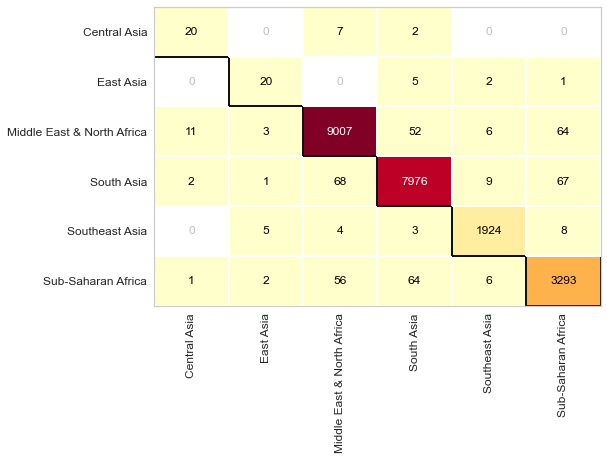

In [38]:
from yellowbrick.classifier import ConfusionMatrix
print('Matriz de Confusão - Dados de Teste:'.format(accuracy_score(y_avaliacao_teste, dtc_avaliacao_yteste)))
cm = ConfusionMatrix(dtc_avaliacao)
cm.fit(X_avaliacao_treinamento, y_avaliacao_treinamento)
cm.score(X_avaliacao_teste, y_avaliacao_teste)

In [39]:
from sklearn.model_selection import GridSearchCV

In [40]:
parametros = {'criterion': ['gini', 'entropy'],
              'splitter': ['best', 'random'],
              # Divisão para cada um dos nós
              # Teste do 'best' como default e random
              'min_samples_split': [2, 5, 10, 15],
              # Número minimo de registros requerido para dividir uma árvore de decisão 
              'min_samples_leaf': [1, 3, 5, 10, 15],
              # Número minimo de registros requeridos para um nó ser reconhecido como um nó folha
              'max_depth': [None, 2, 3, 5, 7, 10]}

In [41]:
grid_search = GridSearchCV(estimator=DecisionTreeClassifier(), param_grid=parametros, cv=5)
# GridSearch combinará todos os parâmetros testando combinados um por um
grid_search.fit(X_avaliacao_treinamento, y_avaliacao_treinamento)
# X -> Atributos previsores
# y -> Respostas esperadas
# fit -> Ajuste e treinamento
melhores_parametros = grid_search.best_params_
# Melhor combinação de parâmetros
melhor_resultado = grid_search.best_score_4
# Resultados
print('Melhores Parâmetros: ' + str(melhores_parametros))
print('Melhor Resultado: ' + str (melhor_resultado))

Melhores Parâmetros: {'criterion': 'entropy', 'max_depth': None, 'min_samples_leaf': 10, 'min_samples_split': 2, 'splitter': 'best'}
Melhor Resultado: 0.983692295399716


In [71]:
dtc_avaliacao = DecisionTreeClassifier(criterion='entropy', max_depth=None, min_samples_leaf=10, min_samples_split=2, splitter='best')
dtc_avaliacao.fit(X_avaliacao_treinamento, y_avaliacao_treinamento)
dtc_avaliacao_yteste       = dtc_avaliacao.predict(X_avaliacao_teste)      #previsores de teste
dtc_avaliacao_ytreinamento = dtc_avaliacao.predict(X_avaliacao_treinamento)
print('Acurácia de Teste Após Tunning dos Parâmetros: {}'.format(accuracy_score(y_avaliacao_teste, dtc_avaliacao_yteste)))

Acurácia de Teste Após Tunning dos Parâmetros: 0.9828110538146239


In [72]:
import sklearn.metrics as m

Matriz de Confusão sem Normalização
[[  17    1    4    0    0    7]
 [   3   19    3    1    2    0]
 [   3    0 9013   62    3   62]
 [   1    2   49 8018    2   51]
 [   1    5    5    2 1921   10]
 [   0    3   39   66    3 3311]]
Matriz de Confusão Normalizada
[[5.86e-01 3.45e-02 1.38e-01 0.00e+00 0.00e+00 2.41e-01]
 [1.07e-01 6.79e-01 1.07e-01 3.57e-02 7.14e-02 0.00e+00]
 [3.28e-04 0.00e+00 9.86e-01 6.78e-03 3.28e-04 6.78e-03]
 [1.23e-04 2.46e-04 6.03e-03 9.87e-01 2.46e-04 6.28e-03]
 [5.14e-04 2.57e-03 2.57e-03 1.03e-03 9.88e-01 5.14e-03]
 [0.00e+00 8.77e-04 1.14e-02 1.93e-02 8.77e-04 9.68e-01]]


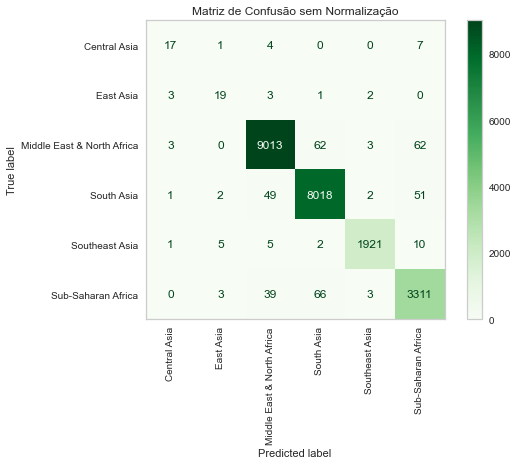

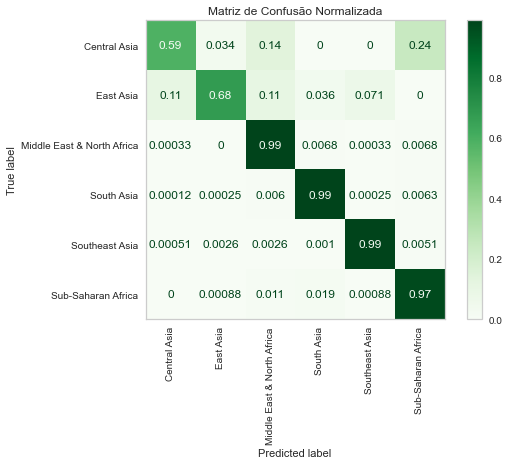

In [73]:
from sklearn.metrics import ConfusionMatrixDisplay
np.set_printoptions(precision=2)
titles_options = [
    ("Matriz de Confusão sem Normalização", None),
    ("Matriz de Confusão Normalizada", "true"),
]
for title, normalize in titles_options:
    disp = ConfusionMatrixDisplay.from_estimator(
        dtc_avaliacao.fit(X_avaliacao_treinamento, y_avaliacao_treinamento),
        X_avaliacao_teste,
        y_avaliacao_teste,
        cmap=plt.cm.Greens,
        normalize=normalize,
        xticks_rotation='vertical',
    )
    disp.ax_.set_title(title)
    plt.grid(False)
    print(title)
    print(disp.confusion_matrix)

plt.show()

In [74]:
print(classification_report(y_avaliacao_teste, dtc_avaliacao_yteste))

                            precision    recall  f1-score   support

              Central Asia       0.68      0.59      0.63        29
                 East Asia       0.63      0.68      0.66        28
Middle East & North Africa       0.99      0.99      0.99      9143
                South Asia       0.98      0.99      0.99      8123
            Southeast Asia       0.99      0.99      0.99      1944
        Sub-Saharan Africa       0.96      0.97      0.96      3422

                  accuracy                           0.98     22689
                 macro avg       0.87      0.87      0.87     22689
              weighted avg       0.98      0.98      0.98     22689



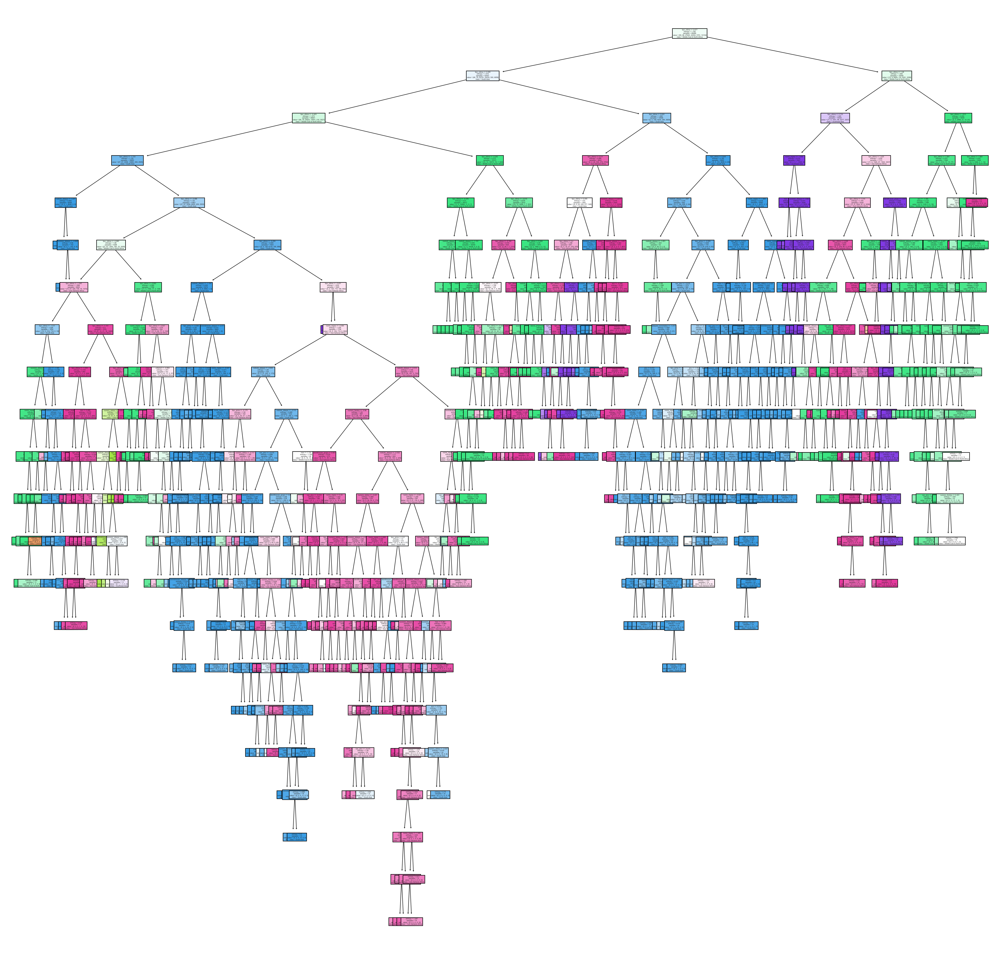

In [75]:
from sklearn import tree
previsores = ['nome_regiao', 'ano', 'mes', 'dia', 'criterio1','criterio2','criterio3', 'ataques_conectados', 'sucesso_ataque','metodo_ataque', 'tipo_vitima', 'nac_alvo', 'identificacao_grupo', 'reivindicacao_ataque', 'tipo_arma', 'numero_obitos', 'numero_feridos', 'danos_propriedades', 'duvida_terrorismo']
fig, axes = plt.subplots(nrows = 1,ncols = 1, figsize = (10,10), dpi=800)
tree.plot_tree(dtc_avaliacao, feature_names=previsores, class_names=['Central Asia','East Asia','Middle East & North Africa', 'South Asia', 'Southeast Asia', 'Sub-Saharan Africa'], filled=True);
fig.savefig('dtc_avaliacao.png')

[Text(0.6974233614123204, 0.9772727272727273, 'X[10] <= 0.677\nentropy = 1.792\nsamples = 68066\nvalue = [59, 88, 27620, 24354, 5791, 10154]'),
 Text(0.4807800650279404, 0.9318181818181818, 'X[10] <= 0.095\nentropy = 1.515\nsamples = 52507\nvalue = [46, 79, 20791, 24235, 500, 6856]'),
 Text(0.29864933974188396, 0.8863636363636364, 'X[10] <= -0.403\nentropy = 1.373\nsamples = 39001\nvalue = [46, 79, 20632, 15001, 216, 3027]'),
 Text(0.10900703499201703, 0.8409090909090909, 'X[10] <= -1.733\nentropy = 1.132\nsamples = 19850\nvalue = [27, 67, 2059, 14983, 209, 2505]'),
 Text(0.04437200638637573, 0.7954545454545454, 'X[9] <= 1.337\nentropy = 0.002\nsamples = 8049\nvalue = [0, 0, 1, 8048, 0, 0]'),
 Text(0.04224321447578499, 0.75, 'entropy = 0.0\nsamples = 7906\nvalue = [0, 0, 0, 7906, 0, 0]'),
 Text(0.04650079829696647, 0.75, 'X[8] <= -0.806\nentropy = 0.06\nsamples = 143\nvalue = [0, 0, 1, 142, 0, 0]'),
 Text(0.04437200638637573, 0.7045454545454546, 'entropy = 0.371\nsamples = 14\nvalue = 

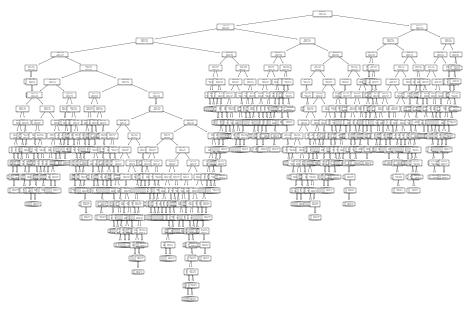

In [76]:
tree.plot_tree(dtc_avaliacao)

In [77]:
text_representation = tree.export_text(dtc_avaliacao)
print(text_representation)

|--- feature_10 <= 0.68
|   |--- feature_10 <= 0.10
|   |   |--- feature_10 <= -0.40
|   |   |   |--- feature_10 <= -1.73
|   |   |   |   |--- feature_9 <= 1.34
|   |   |   |   |   |--- class: South Asia
|   |   |   |   |--- feature_9 >  1.34
|   |   |   |   |   |--- feature_8 <= -0.81
|   |   |   |   |   |   |--- class: South Asia
|   |   |   |   |   |--- feature_8 >  -0.81
|   |   |   |   |   |   |--- class: South Asia
|   |   |   |--- feature_10 >  -1.73
|   |   |   |   |--- feature_10 <= -0.49
|   |   |   |   |   |--- feature_10 <= -0.99
|   |   |   |   |   |   |--- feature_10 <= -1.35
|   |   |   |   |   |   |   |--- feature_10 <= -1.51
|   |   |   |   |   |   |   |   |--- feature_8 <= 1.56
|   |   |   |   |   |   |   |   |   |--- feature_0 <= -1.40
|   |   |   |   |   |   |   |   |   |   |--- feature_2 <= -0.02
|   |   |   |   |   |   |   |   |   |   |   |--- truncated branch of depth 3
|   |   |   |   |   |   |   |   |   |   |--- feature_2 >  -0.02
|   |   |   |   |   |   |   | 

In [49]:
from sklearn.ensemble import RandomForestClassifier

In [50]:
rfc_avaliacao = RandomForestClassifier()
rfc_avaliacao.fit(X_avaliacao_treinamento, y_avaliacao_treinamento)

#previsoes
rfc_avaliacao_yteste       = rfc_avaliacao.predict(X_avaliacao_teste)      #previsores de teste
rfc_avaliacao_ytreinamento = rfc_avaliacao.predict(X_avaliacao_treinamento)#previsores de treinamento

In [51]:
rfc_avaliacao_yteste.shape, rfc_avaliacao_ytreinamento.shape

((22689,), (68066,))

In [52]:
print('Acurácia dos dados de Treinamento: {}'.format(accuracy_score(y_avaliacao_treinamento, rfc_avaliacao_ytreinamento)))
print('Acurácia dos dados de Teste: {}'.format(accuracy_score(y_avaliacao_teste, rfc_avaliacao_yteste)))

Acurácia dos dados de Treinamento: 0.9999265418858168
Acurácia dos dados de Teste: 0.9661069240601172


Matriz de Confusão - Dados de Teste:


0.9661069240601172

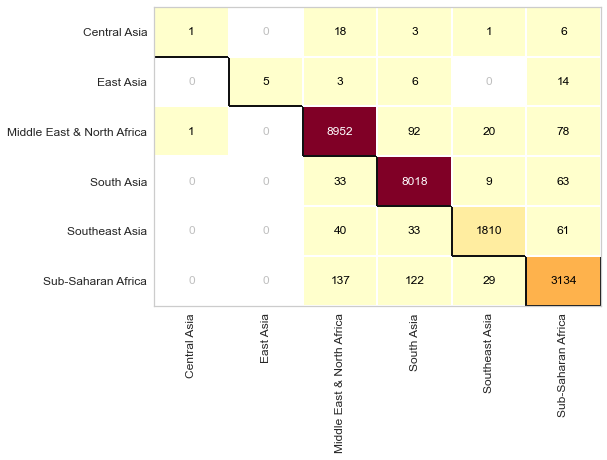

In [53]:
print('Matriz de Confusão - Dados de Teste:'.format(accuracy_score(y_avaliacao_teste, rfc_avaliacao_yteste)))
cm = ConfusionMatrix(rfc_avaliacao)
cm.fit(X_avaliacao_treinamento, y_avaliacao_treinamento)
cm.score(X_avaliacao_teste, y_avaliacao_teste)

In [54]:
parametros_rfc = {'criterion': ['gini', 'entropy'],
              # Método de divisão
              'n_estimators': [10, 40, 100, 150],
              # Definir número de árvores
              'min_samples_split': [2, 5, 10],
              # Número minimo de registros requerido para dividir uma árvore de decisão 
              'min_samples_leaf': [1, 5, 10]}
              # Número minimo de registros requeridos para um nó ser reconhecido como um nó folha

In [55]:
grid_search = GridSearchCV(estimator=RandomForestClassifier(), param_grid=parametros_rfc, cv=5)
grid_search.fit(X_avaliacao_treinamento, y_avaliacao_treinamento)
melhores_parametros_rfc = grid_search.best_params_
melhor_resultado_rfc = grid_search.best_score_
print('Melhores Parâmetros: ' + str(melhores_parametros_rfc))
print('Melhor Resultado: ' + str(melhor_resultado_rfc))

Melhores Parâmetros: {'criterion': 'gini', 'min_samples_leaf': 1, 'min_samples_split': 5, 'n_estimators': 150}
Melhor Resultado: 0.9609202476080949


In [56]:
rfc_avaliacao = RandomForestClassifier(criterion='gini', min_samples_leaf=1, min_samples_split=5, n_estimators=150)
rfc_avaliacao.fit(X_avaliacao_treinamento, y_avaliacao_treinamento)

rfc_avaliacao_yteste       = rfc_avaliacao.predict(X_avaliacao_teste)      
rfc_avaliacao_ytreinamento = rfc_avaliacao.predict(X_avaliacao_treinamento)
print('Acurácia de Teste Após Tunning dos Parâmetros: {}'.format(accuracy_score(y_avaliacao_teste, rfc_avaliacao_yteste)))

Acurácia de Teste Após Tunning dos Parâmetros: 0.9652695138613425


Matriz de Confusão sem Normalização
[[   0    0   18    4    1    6]
 [   0    3    7    5    0   13]
 [   1    0 8951   95   16   80]
 [   0    0   35 8013    8   67]
 [   0    0   47   49 1783   65]
 [   0    0  125  124   24 3149]]
Matriz de Confusão Normalizada
[[0.   0.   0.55 0.1  0.07 0.28]
 [0.   0.11 0.29 0.14 0.   0.46]
 [0.   0.   0.98 0.01 0.   0.01]
 [0.   0.   0.   0.99 0.   0.01]
 [0.   0.   0.03 0.02 0.92 0.03]
 [0.   0.   0.05 0.04 0.01 0.91]]


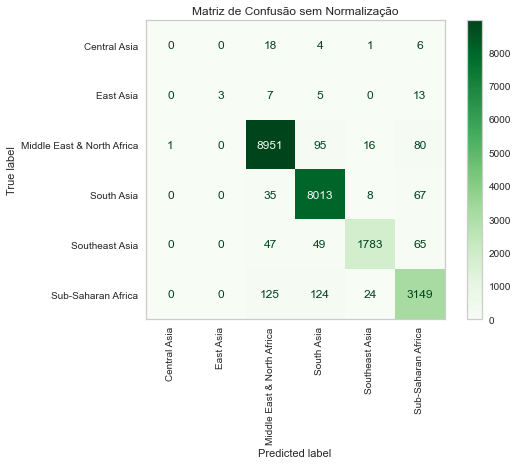

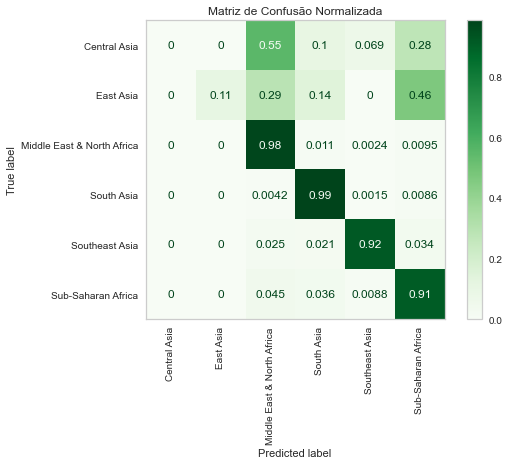

In [57]:
from sklearn.metrics import ConfusionMatrixDisplay
np.set_printoptions(precision=2)
titles_options = [
    ("Matriz de Confusão sem Normalização", None),
    ("Matriz de Confusão Normalizada", "true"),
]
for title, normalize in titles_options:
    disp = ConfusionMatrixDisplay.from_estimator(
        rfc_avaliacao.fit(X_avaliacao_treinamento, y_avaliacao_treinamento),
        X_avaliacao_teste,
        y_avaliacao_teste,
        cmap=plt.cm.Greens,
        normalize=normalize,
        xticks_rotation='vertical',
    )
    disp.ax_.set_title(title)
    plt.grid(False)
    print(title)
    print(disp.confusion_matrix)

plt.show()

In [58]:
print(classification_report(y_avaliacao_teste, rfc_avaliacao_yteste))

                            precision    recall  f1-score   support

              Central Asia       0.00      0.00      0.00        29
                 East Asia       1.00      0.18      0.30        28
Middle East & North Africa       0.98      0.98      0.98      9143
                South Asia       0.97      0.99      0.98      8123
            Southeast Asia       0.97      0.92      0.94      1944
        Sub-Saharan Africa       0.93      0.92      0.93      3422

                  accuracy                           0.97     22689
                 macro avg       0.81      0.66      0.69     22689
              weighted avg       0.96      0.97      0.96     22689



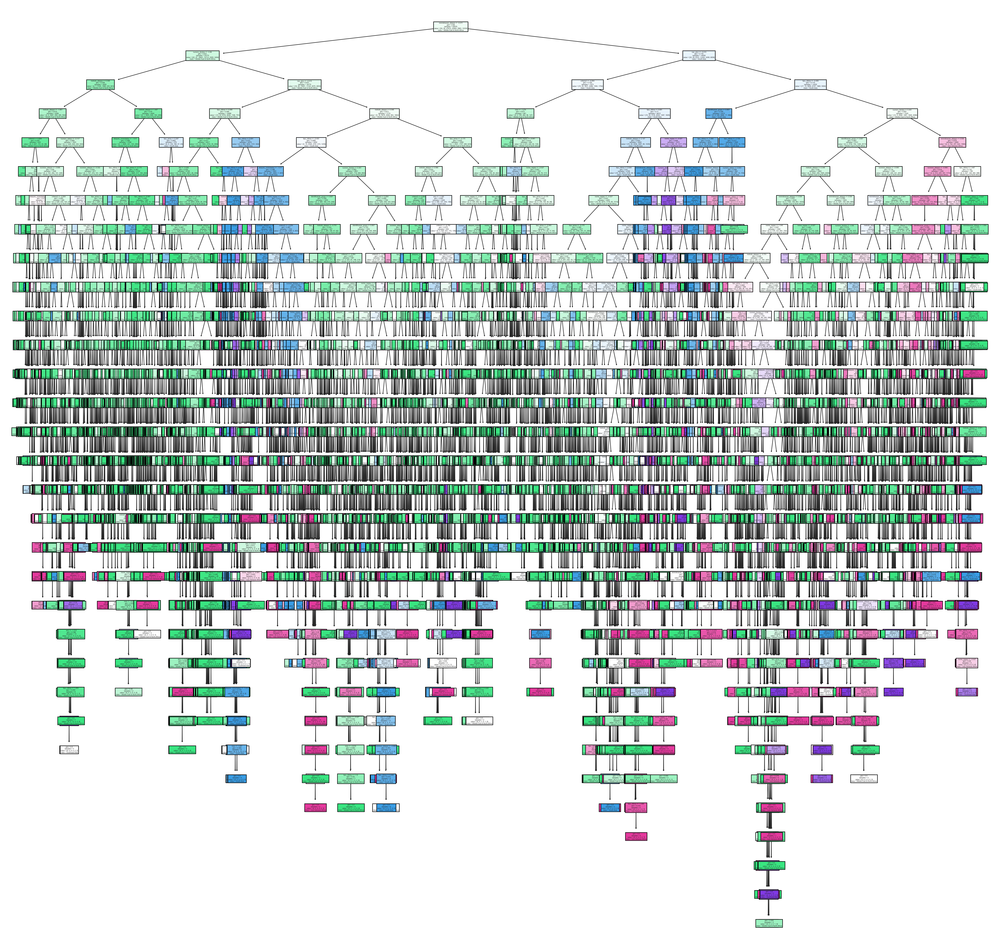

In [59]:
from sklearn.tree import plot_tree
rfc_previsores = ['nome_regiao', 'ano', 'mes', 'dia', 'criterio1','criterio2','criterio3', 'ataques_conectados', 'sucesso_ataque','metodo_ataque', 'tipo_vitima', 'nac_alvo', 'identificacao_grupo', 'reivindicacao_ataque', 'tipo_arma', 'numero_obitos', 'numero_feridos', 'danos_propriedades', 'duvida_terrorismo']
fig, axes = plt.subplots(nrows = 1,ncols = 1, figsize = (10,10), dpi=800)
tree.plot_tree(rfc_avaliacao.estimators_[0], feature_names=rfc_previsores, class_names=['Central Asia','East Asia','Middle East & North Africa', 'South Asia', 'Southeast Asia', 'Sub-Saharan Africa'], filled=True);
fig.savefig('rfc_avaliacao.png')

In [60]:
from sklearn.neighbors import KNeighborsClassifier

In [62]:
knn_avaliacao = KNeighborsClassifier()
knn_avaliacao.fit(X_avaliacao_treinamento, y_avaliacao_treinamento)

#previsoes
knn_avaliacao_yteste       = knn_avaliacao.predict(X_avaliacao_teste)      #previsores de teste
knn_avaliacao_ytreinamento = knn_avaliacao.predict(X_avaliacao_treinamento)#previsores de treinamento

In [63]:
knn_avaliacao_yteste.shape, knn_avaliacao_ytreinamento.shape

((22689,), (68066,))

In [64]:
print('Acurácia dos dados de Treinamento: {}'.format(accuracy_score(y_avaliacao_treinamento, knn_avaliacao_ytreinamento)))
print('Acurácia dos dados de Teste: {}'.format(accuracy_score(y_avaliacao_teste, knn_avaliacao_yteste)))

Acurácia dos dados de Treinamento: 0.8064525607498604
Acurácia dos dados de Teste: 0.7269602009784477


Matriz de Confusão - Dados de Teste:


0.7269602009784477

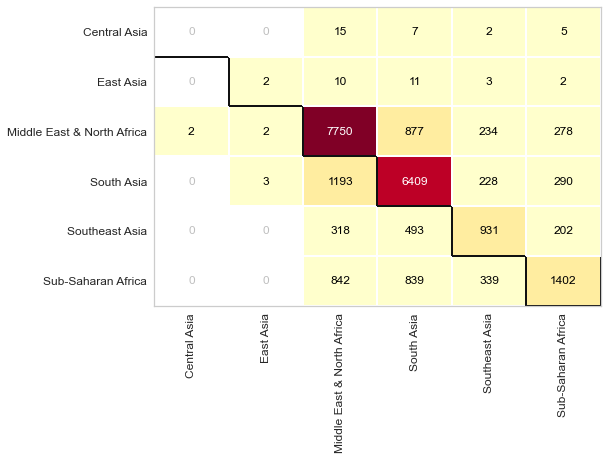

In [65]:
print('Matriz de Confusão - Dados de Teste:'.format(accuracy_score(y_avaliacao_teste, knn_avaliacao_yteste)))
cm = ConfusionMatrix(knn_avaliacao)
cm.fit(X_avaliacao_treinamento, y_avaliacao_treinamento)
cm.score(X_avaliacao_teste, y_avaliacao_teste)

In [66]:
parametros_knn = {'n_neighbors': [3, 5, 10, 20],
                  'weights': ['uniform', 'distance'],
              # Número de vizinhos para o cálculo de distância
                  'metric': ['euclidean', 'manhattan']}
              # Cáculo para medir a similaridade dos parâmetros
              # 1 -> Distância Manhattan
              # 2 -> Distância Euclidiana

In [67]:
grid_search = GridSearchCV(estimator=KNeighborsClassifier(), param_grid=parametros_knn, cv=3)
grid_search.fit(X_avaliacao_treinamento, y_avaliacao_treinamento)
melhores_parametros_knn = grid_search.best_params_
melhor_resultado_knn = grid_search.best_score_
print('Melhores Parâmetros: ' + str(melhores_parametros_knn))
print('Melhor Resultado: ' + str(melhor_resultado_knn))

Melhores Parâmetros: {'metric': 'manhattan', 'n_neighbors': 10, 'weights': 'distance'}
Melhor Resultado: 0.7745276730781914


In [68]:
knn_avaliacao = KNeighborsClassifier(metric='manhattan', n_neighbors=10, weights='distance')
knn_avaliacao.fit(X_avaliacao_treinamento, y_avaliacao_treinamento)

knn_avaliacao_yteste       = knn_avaliacao.predict(X_avaliacao_teste)      #previsores de teste
knn_avaliacao_ytreinamento = knn_avaliacao.predict(X_avaliacao_treinamento)#previsores de treinamento
teste = print('Acurácia de Teste Após Tunning dos Parâmetros: {}'.format(accuracy_score(y_avaliacao_teste, knn_avaliacao_yteste)))

Acurácia de Teste Após Tunning dos Parâmetros: 0.793776719996474


Matriz de Confusão sem Normalização
[[   1    0   12   10    2    4]
 [   0    3   12   10    1    2]
 [   1    0 7964  743  201  234]
 [   0    0  797 6945  192  189]
 [   0    0  183  407 1189  165]
 [   0    0  594  686  234 1908]]
Matriz de Confusão Normalizada
[[3.45e-02 0.00e+00 4.14e-01 3.45e-01 6.90e-02 1.38e-01]
 [0.00e+00 1.07e-01 4.29e-01 3.57e-01 3.57e-02 7.14e-02]
 [1.09e-04 0.00e+00 8.71e-01 8.13e-02 2.20e-02 2.56e-02]
 [0.00e+00 0.00e+00 9.81e-02 8.55e-01 2.36e-02 2.33e-02]
 [0.00e+00 0.00e+00 9.41e-02 2.09e-01 6.12e-01 8.49e-02]
 [0.00e+00 0.00e+00 1.74e-01 2.00e-01 6.84e-02 5.58e-01]]


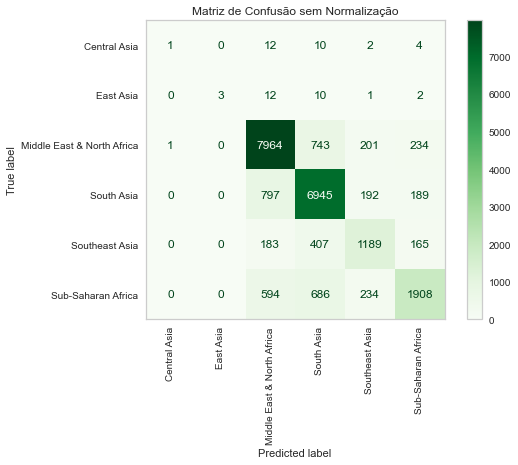

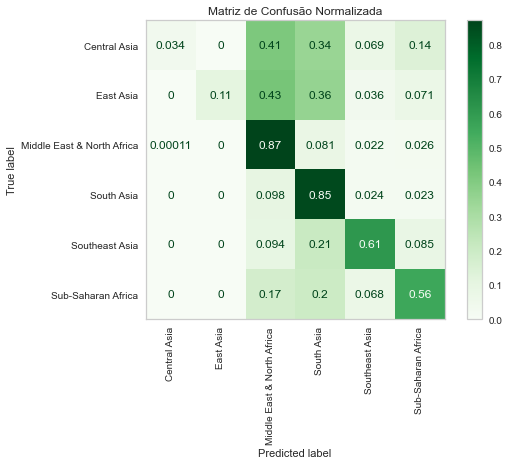

In [69]:
from sklearn.metrics import ConfusionMatrixDisplay
np.set_printoptions(precision=2)
titles_options = [
    ("Matriz de Confusão sem Normalização", None),
    ("Matriz de Confusão Normalizada", "true"),
]
for title, normalize in titles_options:
    disp = ConfusionMatrixDisplay.from_estimator(
        knn_avaliacao.fit(X_avaliacao_treinamento, y_avaliacao_treinamento),
        X_avaliacao_teste,
        y_avaliacao_teste,
        cmap=plt.cm.Greens,
        normalize=normalize,
        xticks_rotation='vertical',
    )
    disp.ax_.set_title(title)
    plt.grid(False)
    print(title)
    print(disp.confusion_matrix)

plt.show()

In [70]:
print(classification_report(y_avaliacao_teste, knn_avaliacao_yteste))

                            precision    recall  f1-score   support

              Central Asia       0.50      0.03      0.06        29
                 East Asia       1.00      0.11      0.19        28
Middle East & North Africa       0.83      0.87      0.85      9143
                South Asia       0.79      0.85      0.82      8123
            Southeast Asia       0.65      0.61      0.63      1944
        Sub-Saharan Africa       0.76      0.56      0.64      3422

                  accuracy                           0.79     22689
                 macro avg       0.76      0.51      0.53     22689
              weighted avg       0.79      0.79      0.79     22689

